# Load libraries, set preferred plotting parameters, and define the preferred colorbar

In [1]:
import numpy as np
import proplot as pplt
import xarray as xr
import scipy.stats as stats
from global_land_mask import globe

# Import the user defined functions useful for analyses and plotting
from functions import (detrend_dim, remove_seasonal_cycle, generate_subplot,
                       stand, linregress_3D, land_mask, high_pass_filter
                       )

# Set plotting parameters
pplt.rc.update(fontsize=14)
pplt.rc['savefig.dpi'] = 500

# Create the custom colormap
reds = pplt.Colormap(('yellow0', 'orange', 'pale red', 'cranberry', 'dark maroon'),
                     alpha=(0.2, 0.5, 1, 1, 1))
blues = pplt.Colormap('Blues_r', alpha=[1, 1, 1, 0.5, 0.2])

colors = blues(np.linspace(0, 1, 128))
colors = np.vstack((colors, [[1, 1, 1, 1]] * 20))  # Add more white in the middle
colors = np.vstack((colors, reds(np.linspace(0, 1, 128))))
divCmap = pplt.Colormap(colors)

redsWhite = reds(np.linspace(0, 1, 128))
redsWhite = np.vstack(([[1, 1, 1, 1]] * 10, redsWhite))
redsWhite = pplt.Colormap(redsWhite)


# Define the user's desired regions of interest

In [2]:
# Define the broader regions of interest, both the labels and the bounding latitudes and longitudes
# The order of these variables (regionLabels, region, regionInd) impacts the order in which they appear in the plotting command.
# Users can change the lat/lon bounding coordinates to apply this regression analysis to any region on the globe.

regionLabels = ['Gulf Stream', 'Kuroshio-Oyashio', 'Agulhas', 'Brazil-Malvinas']
regionHemisphere = ['North', 'North', 'South', 'South']

region = [None, None, None, None, None] 
region[0] = {'lats': 19,  'latn': 58,  'lonw': 268,   'lone': 344}     # Gulf stream
region[1] = {'lats': 20,  'latn': 55,  'lonw': 119,   'lone': 215}     # Kuroshio-Oyashio Extension
region[2] = {'lats': -56, 'latn': -23, 'lonw': 2,     'lone':  92}     # Agulhas
region[3] = {'lats': -60, 'latn': -24, 'lonw': 284.9, 'lone': 350}     # Malvinas

# Define smaller regions of interest, which tightly encapsulate the western boundary currents for purpose of area-averaging
regionInd = [None, None, None, None, None]
regionInd[0] = {'lats': 35,  'latn': 45,  'lonw': 280, 'lone': 310}     # Gulf stream
regionInd[1] = {'lats': 31,  'latn': 45,  'lonw': 140, 'lone': 170}     # Kuroshio-Oyashio Extension
regionInd[2] = {'lats': -45, 'latn': -35, 'lonw': 11,  'lone': 60}      # Agulhas
regionInd[3] = {'lats': -50, 'latn': -35, 'lonw': 305, 'lone': 320}     # Malvinas

numRegions = np.shape(regionLabels)[0]


# Read in, detrend, remove seasonal cycle, and spatially filter the data

## Read in data

In [3]:
path = '/glade/work/jamesl/ERA5/'

SST = xr.open_dataset(path+'ERA5.h0.SST.197901-202309.nc')['SST'].sel(time=slice('2008', '2010'))
w = xr.open_dataset(path+'ERA5.h0.w.197901-202309.nc')['w']*1000  # convert from m/s to mm/s
w.attrs['units'] = 'mm/s'
PRECT = xr.open_dataset(path+'ERA5.h0.PRECT.197901-202309.nc')['PRECT'].sel(time=slice('2008', '2010'))


## Remove linear trend from data as a function of gridpoint

In [4]:
SSTdet = detrend_dim(SST, 'time')
wdet = detrend_dim(w, 'time')
PRECTdet = detrend_dim(PRECT, 'time')

## Remove seasonal cycle to create anomalies

In [5]:
SSTdetAnom = remove_seasonal_cycle(SSTdet)
wdetAnom = remove_seasonal_cycle(wdet)
PRECTdetAnom = remove_seasonal_cycle(PRECTdet)

## Spatially high pass filter precipitation data to remove effects of synoptic storms

In [6]:
PRECTdetAnomHPfilt = high_pass_filter(data=PRECTdetAnom, window_size=41,)

# Or, if the above processing steps have already been completed, read in the processed data

In [12]:
path = '/glade/work/jamesl/ERA5/'
SSTdetAnom = xr.open_dataset(path+'ERA5.h0.SST.detrended.anomalies.197901-202309.nc'
                             )['SST']
wdetAnom = xr.open_dataset(path+'ERA5.h0.w.detrended.anomalies.mmPerSec.197901-202309.nc'
                           )['w']
PRECTdetAnomHPfilt = xr.open_dataset(path+'ERA5.h0.PRECT.detrended.anomalies.1000kmHighPassFiltered.200701-202309.nc'
                                     )['PRECT']

# Main text figures below

## Figure out text labels

In [6]:
data = xr.open_dataset('/glade/work/jamesl/ERA5/ERA5.h0.SST.197901-202309.nc'
                       )['SST'].sel(time='2023-01'
                                    ).sel(lon=slice(300, 302), lat=slice(40, 45)
                                          )[0]
data

<xarray.DataArray 'SST' (lat: 21, lon: 9)>
array([[290.73517, 290.19247, 289.7896 , 289.552  , 289.4697 , 289.46722,
        289.7958 , 290.3837 , 291.34534],
       [290.77478, 290.25806, 289.8583 , 289.63058, 289.52106, 289.37378,
        289.5019 , 289.6826 , 290.2686 ],
       [291.00003, 290.53345, 290.03033, 289.7197 , 289.6083 , 289.53033,
        289.4394 , 289.58975, 289.89917],
       [290.95053, 290.63678, 290.0879 , 289.77786, 289.68073, 289.70175,
        289.61203, 289.52292, 289.71228],
       [290.578  , 290.31873, 289.84717, 289.62006, 289.51984, 289.62625,
        289.57983, 289.49197, 289.5916 ],
       [289.6968 , 289.6696 , 289.49136, 289.26053, 289.15967, 289.36078,
        289.3156 , 289.3317 , 289.3874 ],
       [288.9821 , 288.8707 , 288.7946 , 288.78592, 288.7686 , 288.84595,
        288.97278, 289.10645, 288.99136],
       [287.93134, 288.07922, 288.2723 , 288.27167, 288.1374 , 288.1442 ,
        288.19495, 288.11264, 287.67453],
       [287.45297, 287.72836, 287.8707 , 287.79086, 287.55508, 287.40225,
        287.125  , 286.82303, 286.74136],
       [287.12067, 287.4004 , 287.5947 , 287.6807 , 287.43814, 287.13553,
        286.70856, 286.3874 , 286.23517],
       [286.74567, 287.19617, 287.375  , 287.18936, 287.28775, 286.9765 ,
        286.66586, 286.05383, 285.8521 ],
       [285.2463 , 285.82797, 286.09903, 286.21597, 286.42328, 286.43875,
        286.47958, 285.70978, 285.1578 ],
       [282.724  , 283.12067, 283.56436, 284.24878, 285.1609 , 285.37006,
        285.4338 , 284.3942 , 283.76608],
       [280.36633, 280.64728, 281.01483, 281.83417, 282.86942, 283.15842,
        283.2135 , 282.24072, 282.03714],
       [278.9876 , 279.15408, 279.51978, 279.83167, 280.2178 , 280.5037 ,
        280.66458, 280.7104 , 280.5068 ],
       [278.36322, 278.3861 , 278.4047 , 278.51794, 278.68933, 278.77908,
        279.11694, 279.38797, 279.60333],
       [278.40158, 278.39975, 278.37375, 278.3094 , 278.10022, 278.04517,
        278.12375, 278.35333, 278.6547 ],
       [278.5167 , 278.40283, 278.31064, 278.2184 , 278.0427 , 277.90717,
        277.7865 , 277.94553, 278.12128],
       [278.42944, 278.39355, 278.30258, 278.15158, 278.0309 , 277.90158,
        277.75616, 277.7741 , 277.74564],
       [278.34714, 278.27722, 278.18747, 278.07486, 277.9616 , 277.83167,
        277.6745 , 277.56372, 277.52905],
       [278.0996 , 278.0866 , 278.05133, 277.93192, 277.7995 , 277.65405,
        277.50742, 277.44986, 277.41583]], dtype=float32)
Coordinates:
  * lon      (lon) float32 300.0 300.2 300.5 300.8 301.0 301.2 301.5 301.8 302.0
  * lat      (lat) float32 40.0 40.25 40.5 40.75 41.0 ... 44.25 44.5 44.75 45.0
    time     datetime64[ns] 2023-01-01
Attributes:
    units:      K
    long_name:  Sea surface temperature

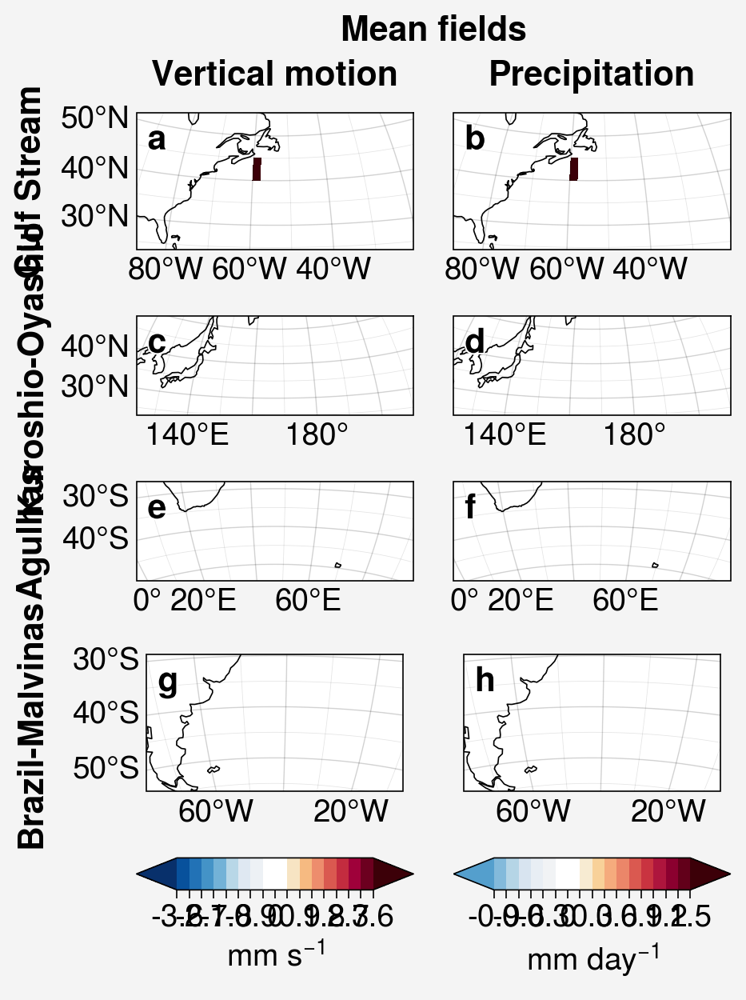

In [10]:
gs = pplt.GridSpec(ncols=2, nrows=4)
fig = pplt.figure(refwidth='44mm', suptitle='Mean fields')

lvlsSST   = np.arange(275, 275.1+7*3, 3)
lvlsW     = np.arange(-3.6, 3.61, 0.45)
lvlsPrect = np.array([-0.9, -0.75, -0.6, -0.45, -0.3, -0.15,  0., 0.15, 0.3, 0.45, 0.6, 0.75, 0.9, 1.05,
                      1.2, 1.35, 1.5])

# Define custom normalization for asymmetric colorbars
normPrect = pplt.Norm('diverging', fair=True, vmin=-0.9, vcenter=0, vmax=1.5)

for ii, val in enumerate(regionLabels):

    # Determine the winter months depending on which hemisphere the region of interest is located in
    if regionHemisphere[ii] == 'North':
        dateE = slice('2007-10', '2023-03')
        months = [10, 11, 12, 1, 2, 3]
    elif regionHemisphere[ii] == 'South':
        dateE = slice('2008-04', '2023-09')
        months = [4, 5, 6, 7, 8, 9]

    ax = generate_subplot(fig, loc=gs[ii, 0], region=region[ii])
    n = ax.contourf(data, levels=lvlsW, cmap=divCmap, extend='both')

    ax = generate_subplot(fig, loc=gs[ii, 1], region=region[ii], latlabels=False)
    o = ax.contourf(data, levels=lvlsPrect, extend='both', cmap=divCmap, norm=normPrect)

fig.format(rowlabels=regionLabels,
           collabels=['Vertical motion', 'Precipitation'])

# fig.colorbar(m, loc='b', label='K', col=1, ticklabelsize='large', labelsize='x-large')

# tlabels = [str(np.round(val, decimals=1)) for val in lvlsW]
# tlabels = ["" if i % 2 == 1 else elem for i, elem in enumerate(tlabels)]
tlabels = ['-3.6', '', '-2.7', '', '-1.8', '', '-0.9', '', '0', '',
           '0.9', '', '1.8', '',  '2.7', '',  '3.6']
fig.colorbar(n, loc='b', label='mm s$^{-1}$', col=1, ticklabels=tlabels)

tlabels = ['-0.9', '', '-0.6', '', '-0.3', '',  '0', '', '0.3', '', '0.6', '', '0.9', '',
           '1.2', '', '1.5']
fig.colorbar(o, loc='b', label='mm day$^{-1}$', col=2, ticklabels=tlabels)

fig.save('figures/test.pdf')


## Mean of SST (black contours), w$_{850}$, and spatially high-pass filtered total precipitation

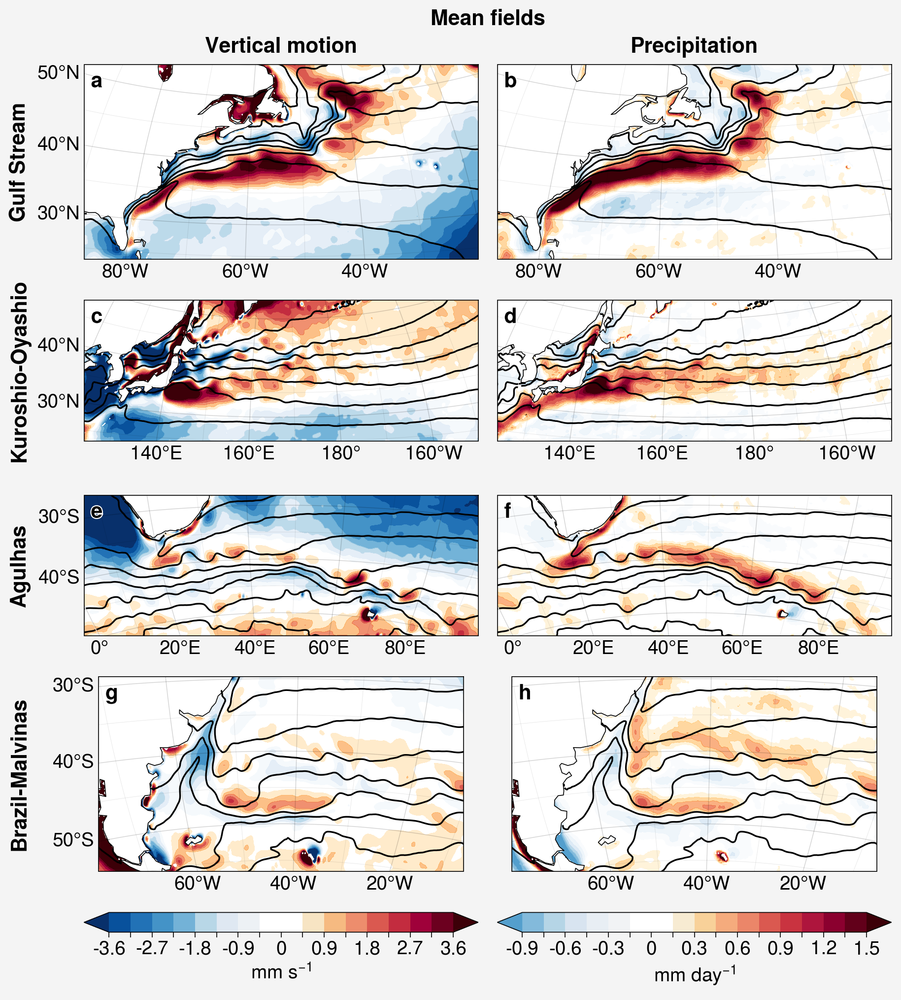

In [40]:
gs = pplt.GridSpec(ncols=2, nrows=4)
fig = pplt.figure(refwidth=4, suptitle='Mean fields')

lvlsSST   = np.arange(275, 275.1+7*3, 3)
lvlsW     = np.arange(-3.6, 3.61, 0.45)
lvlsPrect = np.array([-0.9, -0.75, -0.6, -0.45, -0.3, -0.15,  0., 0.15, 0.3, 0.45, 0.6, 0.75, 0.9, 1.05,
                      1.2, 1.35, 1.5])

# Define custom normalization for asymmetric colorbars
normPrect = pplt.Norm('diverging', fair=True, vmin=-0.9, vcenter=0, vmax=1.5)

for ii, val in enumerate(regionLabels):

    # Determine the winter months depending on which hemisphere the region of interest is located in
    if regionHemisphere[ii] == 'North':
        dateE = slice('2007-10', '2023-03')
        months = [10, 11, 12, 1, 2, 3]
    elif regionHemisphere[ii] == 'South':
        dateE = slice('2008-04', '2023-09')
        months = [4, 5, 6, 7, 8, 9]

    path = '/glade/work/jamesl/ERA5/'
    SSTE5 = xr.open_dataset(path+'ERA5.h0.SST.197901-202309.nc'
                            )['SST'].sel(time=dateE,
                                         # lon=slice(region[ii]['lonw'], region[ii]['lone']),
                                         lat=slice(region[ii]['lats'], region[ii]['latn'])).load()

    wE5 = xr.open_dataset(path+'ERA5.h0.w850.75kmLowPassSpatialFilterx2.200701-202309.nc'
                          )['w'].sel(time=dateE,
                                     # lon=slice(region[ii]['lonw'], region[ii]['lone']),
                                     lat=slice(region[ii]['lats'], region[ii]['latn'])
                                     ).load()

    prectE5 = xr.open_dataset(path+'ERA5.h0.PRECT.1000kmHighPassFiltered.197901-202309.nc'
                              )['PRECT'].sel(time=dateE,
                                          # lon=slice(region[ii]['lonw'], region[ii]['lone']),
                                          lat=slice(region[ii]['lats'], region[ii]['latn'])
                                          ).load()

    SSTE5   = SSTE5.where(  land_mask(SSTE5))
    wE5     = wE5.where(    land_mask(wE5))
    prectE5 = prectE5.where(land_mask(prectE5))

    data  = SSTE5[    SSTE5['time.month'].isin(months)].mean('time')
    data1 = wE5[        wE5['time.month'].isin(months)].mean('time')
    data2 = prectE5[prectE5['time.month'].isin(months)].mean('time')

    ax = generate_subplot(fig, loc=gs[ii, 0], region=region[ii])
    # n, ax = plot_it(gs[ii, 0], data1, lvlsW, region[ii], cmap=divCmap)
    n = ax.contourf(data1, levels=lvlsW, cmap=divCmap, extend='both')
    ax.contour(data['lon'], data['lat'], data, levels=lvlsSST, extend='both', c='k', lw=1.2)
    ax.format(land=True, landcolor='white')

    # o, ax = plot_it(gs[ii, 1], data2, lvlsPrect, region[ii], cmap=divCmap, latlabels=False)
    ax = generate_subplot(fig, loc=gs[ii, 1], region=region[ii], latlabels=False)
    o = ax.contourf(data2, levels=lvlsPrect, extend='both', cmap=divCmap, norm=normPrect)
    ax.contour(data['lon'], data['lat'], data, levels=lvlsSST, extend='both', c='k', lw=1.2)
    ax.format(land=True, landcolor='white')

fig.format(rowlabels=regionLabels,
           collabels=['Vertical motion', 'Precipitation'])

# fig.colorbar(m, loc='b', label='K', col=1, ticklabelsize='large', labelsize='x-large')

# tlabels = [str(np.round(val, decimals=1)) for val in lvlsW]
# tlabels = ["" if i % 2 == 1 else elem for i, elem in enumerate(tlabels)]
tlabels = ['-3.6', '', '-2.7', '', '-1.8', '', '-0.9', '', '0', '',
           '0.9', '', '1.8', '',  '2.7', '',  '3.6']
fig.colorbar(n, loc='b', label='mm s$^{-1}$', col=1, ticklabels=tlabels)

tlabels = ['-0.9', '', '-0.6', '', '-0.3', '',  '0', '', '0.3', '', '0.6', '', '0.9', '',
           '1.2', '', '1.5']
fig.colorbar(o, loc='b', label='mm day$^{-1}$', col=2, ticklabels=tlabels)

fig.save('figures/Fig1-meanFieldOfSST_filtw850_filtPRECT-ERA5-LarsonThompsonHurrell2024.pdf')


## Calculate and plot the standard deviation of SST anomalies and the regression of anomalous w$_{850}$ and PRECT onto SST anomalies

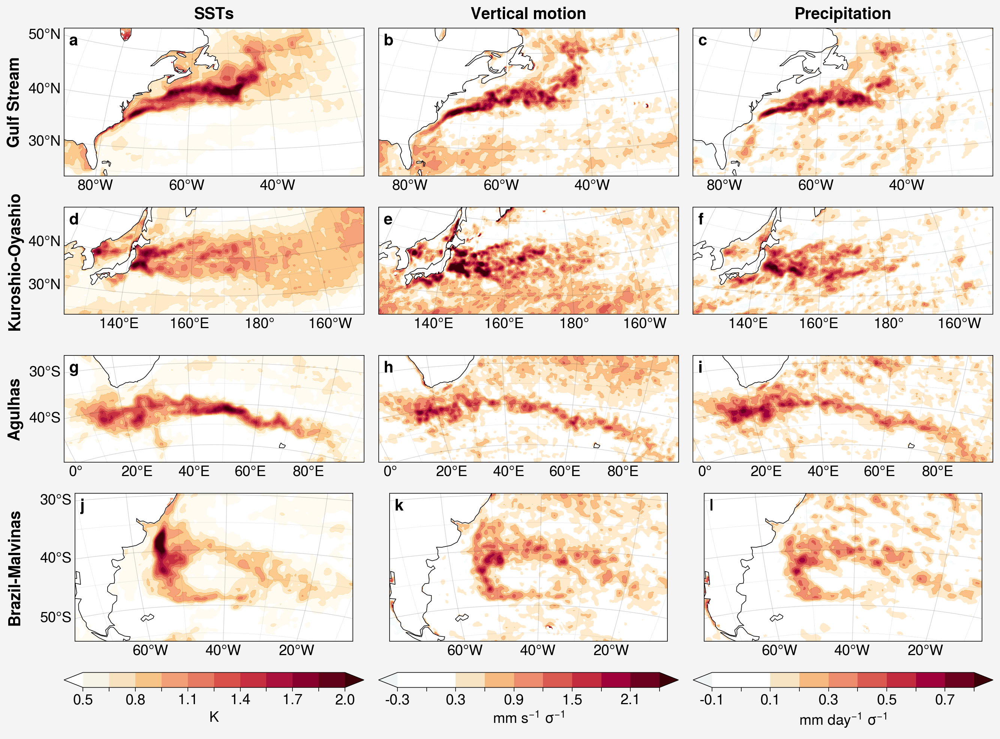

In [28]:
# Set up the grid for the plots and create the figure with a reference width for the subplots
gs = pplt.GridSpec(ncols=3, nrows=4)
fig = pplt.figure(refwidth=4)

# Define the contour levels for the plots
lvlsSST = np.arange(0.5, 2.1, 0.15)
lvlsW = np.arange(-0.3, 2.41, 0.3)
lvlsPrect = np.arange(-0.1, 0.81, 0.1)
normW = pplt.Norm('diverging', fair=True, vmin=-0.3, vcenter=0, vmax=2.4)
normPrect = pplt.Norm('diverging', fair=True, vmin=-0.1, vcenter=0, vmax=0.8)

# Iterate through each user-defined region
# Each iteration will perform and plot a regression analysis for the region of interest
for ii, val in enumerate(regionLabels):

    # Determine the winter months depending on which hemisphere the region of interest is located in
    if regionHemisphere[ii] == 'North':
        dateE = slice('2007-10', '2023-03')
        months = [10, 11, 12, 1, 2, 3]
    elif regionHemisphere[ii] == 'South':
        dateE = slice('2008-04', '2023-09')
        months = [4, 5, 6, 7, 8, 9]

    # Select the regions of interest (roi)
    SST_roi = SSTdetAnom.sel(time=dateE,
                             # lon=slice(region[ii]['lonw'], region[ii]['lone']),
                             lat=slice(region[ii]['lats'], region[ii]['latn'])
                             )
    # Mask out the lakes in land regions
    SST_roi = SST_roi.where(land_mask(SST_roi))

    w_roi = wdetAnom.sel(time=dateE, level=850,
                         # lon=slice(region[ii]['lonw'], region[ii]['lone']),
                         lat=slice(region[ii]['lats'], region[ii]['latn'])
                         )

    prect_roi = PRECTdetAnomHPfilt.sel(time=dateE,
                                       # lon=slice(region[ii]['lonw'], region[ii]['lone']),
                                       lat=slice(region[ii]['lats'], region[ii]['latn'])
                                       )
    # Preallocate regression arrays
    wReg = w_roi[0].copy(deep=True)
    prectReg = prect_roi[0].copy(deep=True)

    # Index the winter months and standardize SST anomalies
    data  = w_roi[w_roi['time.month'].isin(months)]
    data1 = stand(SST_roi[SST_roi['time.month'].isin(months)])
    # Regress anomalous vertical motion onto standardized SST anomlies
    wReg[:, :] = linregress_3D(data1.values, data.values)[2]

    data  = prect_roi[prect_roi['time.month'].isin(months)]
    data1 = stand(SST_roi[SST_roi['time.month'].isin(months)])
    prectReg[:, :] = linregress_3D(data1.values, data.values)[2]

    # Perform standard deviation
    data = SST_roi[SST_roi['time.month'].isin(months)].std('time')

    # Plot the data in each column
    ax = generate_subplot(fig, gs[ii, 0], region[ii])
    l = ax.contourf(data, levels=lvlsSST, extend='both', cmap=redsWhite)

    ax = generate_subplot(fig, gs[ii, 1], region[ii], latlabels=False)
    m = ax.contourf(wReg, levels=lvlsW, extend='both', cmap=divCmap, norm=normW)

    ax = generate_subplot(fig, gs[ii, 2], region[ii], latlabels=False)
    n = ax.contourf(prectReg, levels=lvlsPrect, extend='both', cmap=divCmap, norm=normPrect)

fig.format(rowlabels=regionLabels,
           collabels=['SSTs', 'Vertical motion', 'Precipitation'])

# Add colorbars and ensure that the tick labels are neat and at a consistent spacing
tlabels = [str(np.round(val, decimals=1)) for val in lvlsSST]
tlabels = ["" if i % 2 == 1 else elem for i, elem in enumerate(tlabels)]
fig.colorbar(l, loc='b', label='K', col=1, ticklabels=tlabels)

tlabels = [str(np.round(val, decimals=1)) for val in lvlsW]
tlabels = ["" if i % 2 == 1 else elem for i, elem in enumerate(tlabels)]
fig.colorbar(m, loc='b', label='mm s$^{-1}$ σ$^{-1}$', col=2, ticklabels=tlabels)

tlabels = [str(np.round(val, decimals=1)) for val in lvlsPrect]
tlabels = ["" if i % 2 == 1 else elem for i, elem in enumerate(tlabels)]
fig.colorbar(n, loc='b', label='mm day$^{-1}$ σ$^{-1}$', col=3, ticklabels=tlabels)

fig.save('figures/Fig2-stdDevOfAnomalousSST_regressonOfw850_PRECT-detrended-ERA5-LarsonThompsonHurrell2024.pdf')


## Calculate and plot the vertical profile of anomalous vertical motion regressed onto SST anomalies

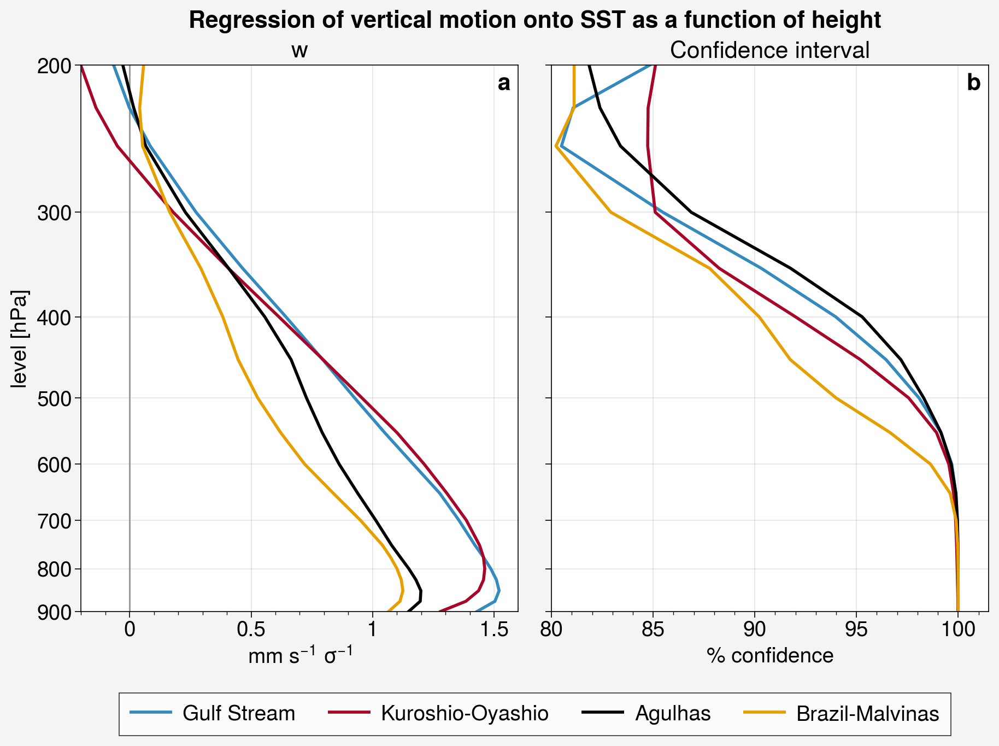

In [42]:
# Create the figure with specified reference width, aspect ratio, and shared x-axis
fig = pplt.figure(refwidth=4, refaspect=0.8, sharex=False,
                  suptitle='Regression of vertical motion onto SST as a function of height')
# Create subplots with reversed y-axis and logarithmic scale for y-axis
axs = fig.subplots(ncols=2, yreverse=True, yscale='log', yticks=True,
                   ylabel='level [hPa]', abc=True, abcloc='ur')

# Degrees of freedom 
# Calculated in another script based on 16 years of data and combined autoregression of ocean and atmospheric states
dof = 88

# Plot vertical grey lines at 0 for reference
axs[0].vlines(0, 200, 900, c='grey', lw=1)
axs[1].vlines(0, 200, 900, c='grey', lw=1)

# Define colors for plotting each region
colors = ['#348abdff', '#a60628ff', 'k', '#E69F00']

# Iterate through each region of interest
for ii, iiVal in enumerate(regionLabels):

    # Determine the winter months depending on which hemisphere the region of interest is located in
    if regionHemisphere[ii] == 'North':
        dateE = slice('2007-10', '2023-03')
        months = [10, 11, 12, 1, 2, 3]
    elif regionHemisphere[ii] == 'South':
        dateE = slice('2008-04', '2023-09')
        months = [4, 5, 6, 7, 8, 9]

    # First, create a consistent spatial mask to apply to all vertical levels of w
    # Make this spatial mask based on a regression threshold, to capture the core of the western boundary currents
    SST_roi = SSTdetAnom.sel(time=dateE,
                             lon=slice(regionInd[ii]['lonw'], regionInd[ii]['lone']),
                             lat=slice(regionInd[ii]['lats'], regionInd[ii]['latn'])
                             )

    w_roi = wdetAnom.sel(time=dateE, level=slice(200, 900),
                         lon=slice(regionInd[ii]['lonw'], regionInd[ii]['lone']),
                         lat=slice(regionInd[ii]['lats'], regionInd[ii]['latn'])
                         )

    # Index the winter months and the vertical level of the iteration
    data  = w_roi[w_roi['time.month'].isin(months)].sel(level=850)
    data1 = stand(SST_roi[SST_roi['time.month'].isin(months)])
    # Regress anomalous vertical motion onto standardized SST anomalies
    # The spatial mask is based on a threshold of 0.8 mm/s/σ regression
    wMask = linregress_3D(data1.values, data.values)[2] > 0.8

    # Preallocate arrays for storing regressions as a function of height
    wTvals = w_roi[0, 0].copy(deep=True)
    wReg   = w_roi[0, 0].copy(deep=True)
    wRegAvg   = np.zeros(w_roi['level'].size)
    wTvalsAvg = np.zeros(w_roi['level'].size)

    # Iterate through each vertical level of vertical motion
    # In each iteration, calculate a spatial average of gridpoint regressions and Student's t-values for statistical significance
    for zz, levVal in enumerate(w_roi['level']):

        # Index the winter months and the vertical level of the iteration
        data  = w_roi[w_roi['time.month'].isin(months)][:, zz]
        data1 = stand(SST_roi[SST_roi['time.month'].isin(months)])
        # Regress anomalous vertical motion onto standardized SST anomalies
        wTvals[:, :], wReg[:, :] = linregress_3D(data1.values, data.values)[1:3]

        # Calculate the t statistic based on gridpoint correlations
        wTvals = wTvals*np.sqrt(dof-2)/np.sqrt(1-wTvals**2)

        # Calculate area averaged regression values
        wRegAvg[zz] = wReg.where(wMask
                                 ).weighted(np.cos(np.deg2rad(wReg.lat))
                                            ).mean(['lat', 'lon']).values

        # Calculate area averaged t values
        wTvalsAvg[zz] = np.sqrt((wTvals**2).where(wMask
                                                  ).weighted(np.cos(np.deg2rad(wTvals.lat))
                                                             ).mean(['lat', 'lon'])
                                )

    axs[0].plot(wRegAvg, w_roi['level'].values, c=colors[ii], lw=2, label=regionLabels[ii])
    axs[1].plot(stats.t.cdf(wTvalsAvg, loc=0, scale=1, df=dof)*100, w_roi['level'].values, c=colors[ii], lw=2)

    axs[0].format(xlabel='mm s$^{-1}$ σ$^{-1}$', xlim=(-0.2, 1.6), title='w')
    axs[1].format(xlabel='% confidence', xlim=(80, 101.5), title='Confidence interval')

fig.legend(loc='b', ncols=4)

fig.save('figures/Fig3-verticalProfileOfOmegaRegression-88dof-ERA5-LarsonThompsonHurrell2024a.pdf')


## Figure 4 - As in Figure 2 but for iHESP HR

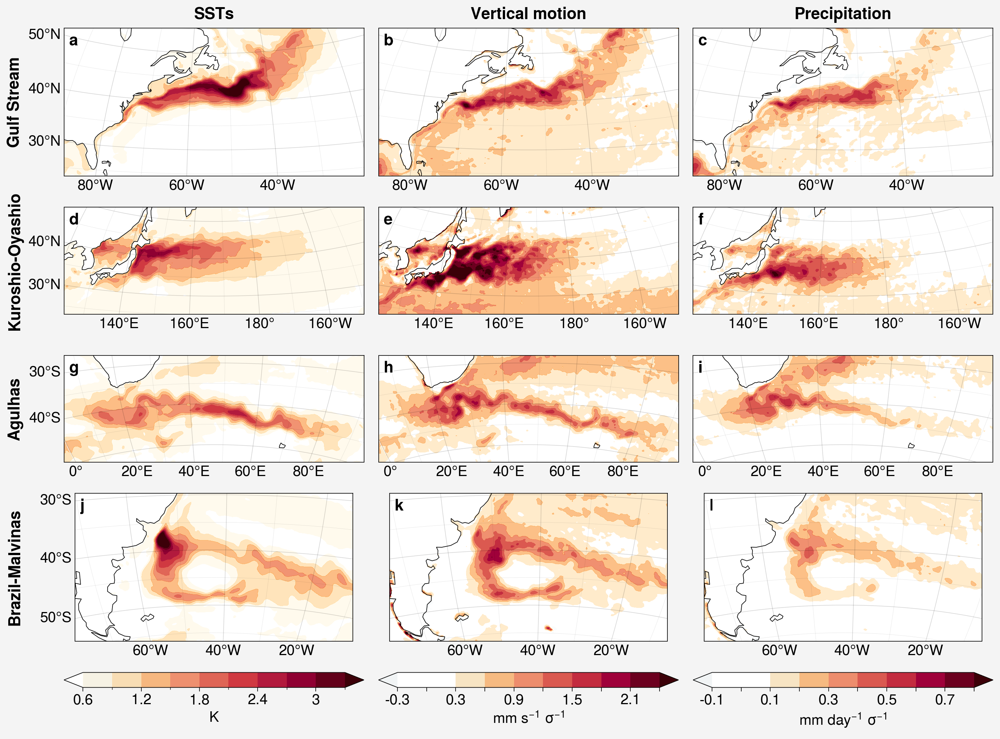

In [5]:
gs = pplt.GridSpec(ncols=3, nrows=4)
fig = pplt.figure(refwidth=4)

# Define the contour levels for the plots
lvlsSST = np.arange(0.6, 3.31, 0.3)
lvlsW = np.arange(-0.3, 2.41, 0.3)
lvlsPrect = np.arange(-0.1, 0.81, 0.1)
normW = pplt.Norm('diverging', fair=True, vmin=-0.3, vcenter=0, vmax=2.4)
normPrect = pplt.Norm('diverging', fair=True, vmin=-0.1, vcenter=0, vmax=0.8)

for ii, val in enumerate(regionLabels):
# for ii, val in enumerate([1]):

    # Determine the winter months depending on which hemisphere the region of interest is located in
    if regionHemisphere[ii] == 'North':
        datei = slice('0250-06', '0500-07')
        months = [10, 11, 12, 1, 2, 3]
    elif regionHemisphere[ii] == 'South':
        datei = slice('0250-01', '0500-12')
        months = [4, 5, 6, 7, 8, 9]

    path = '/glade/work/jamesl/iHESP/HR/monthly/'
    SSTHRanom = xr.open_dataset(path+'iHESP.HR.PIctrl.h0.SST.anomalies.025001-051912.nc', use_cftime=True
                                )['SST'].sel(time=datei,
                                             # lon=slice(region[ii]['lonw'], region[ii]['lone']),
                                             lat=slice(region[ii]['lats'], region[ii]['latn'])).load()

    wHRanom = xr.open_dataset(path+'iHESP.HR.PIctrl.h0.w.anomalies.025001-051912.nc', use_cftime=True
                              )['w'].sel(time=datei,
                                         # lon=slice(region[ii]['lonw'], region[ii]['lone']),
                                         lat=slice(region[ii]['lats'], region[ii]['latn'])
                                         ).load().interp_like(SSTHRanom[0], kwargs={"fill_value": "extrapolate"}
                                                              )*1000  # convert to mm/s

    prectHRanom = xr.open_dataset(path+'iHESP.HR.PIctrl.h0.PRECT.anomalies.1000kmHPfilter.025001-050012.nc', use_cftime=True
                                  )['PRECT'].sel(time=datei,
                                                 # lon=slice(region[ii]['lonw'], region[ii]['lone']),
                                                 lat=slice(region[ii]['lats'], region[ii]['latn'])
                                                 ).load().interp_like(SSTHRanom[0], kwargs={"fill_value": "extrapolate"}
                                                                      )

    wReg = wHRanom[0].copy(deep=True)
    prectReg = prectHRanom[0].copy(deep=True)

    data  = wHRanom[wHRanom['time.month'].isin(months)]
    data1 = stand(SSTHRanom[SSTHRanom['time.month'].isin(months)])
    wReg[:, :] = linregress_3D(data1.values, data.values)[2]

    data  = prectHRanom[prectHRanom['time.month'].isin(months)]
    data1 = stand(SSTHRanom[SSTHRanom['time.month'].isin(months)])
    prectReg[:, :] = linregress_3D(data1.values, data.values)[2]

    data = SSTHRanom[SSTHRanom['time.month'].isin(months)].std('time')

    # Plot the data in each column
    ax = generate_subplot(fig, gs[ii, 0], region[ii])
    m = ax.contourf(data, levels=lvlsSST, extend='both', cmap=redsWhite)

    ax = generate_subplot(fig, gs[ii, 1], region[ii], latlabels=False)
    n = ax.contourf(wReg, levels=lvlsW, extend='both', cmap=divCmap, norm=normW)

    ax = generate_subplot(fig, gs[ii, 2], region[ii], latlabels=False)
    o = ax.contourf(prectReg, levels=lvlsPrect, extend='both', cmap=divCmap, norm=normPrect)

fig.format(rowlabels=regionLabels,
           collabels=['SSTs', 'Vertical motion', 'Precipitation'])

fig.colorbar(m, loc='b', label='K', col=1)

tlabels = [str(np.round(val, decimals=1)) for val in lvlsW]
tlabels = ["" if i % 2 == 1 else elem for i, elem in enumerate(tlabels)]
fig.colorbar(n, loc='b', label='mm s$^{-1}$ σ$^{-1}$', col=2, ticklabels=tlabels)

tlabels = [str(np.round(val, decimals=1)) for val in lvlsPrect]
tlabels = ["" if i % 2 == 1 else elem for i, elem in enumerate(tlabels)]
fig.colorbar(o, loc='b', label='mm day$^{-1}$ σ$^{-1}$', col=3, ticklabels=tlabels)

# fig.save('stdDevOfAnomalousSST_regressOmega850_PRECTfilt-iHESP-HR-LarsonThompsonHurrell2024a.png')
fig.save('figures/Fig4-stdDevOfAnomalousSST_regressW850_filtPRECT-iHESP-HR-LarsonThompsonHurrell2024a.pdf')



## Figure 5 - As in Figure 2

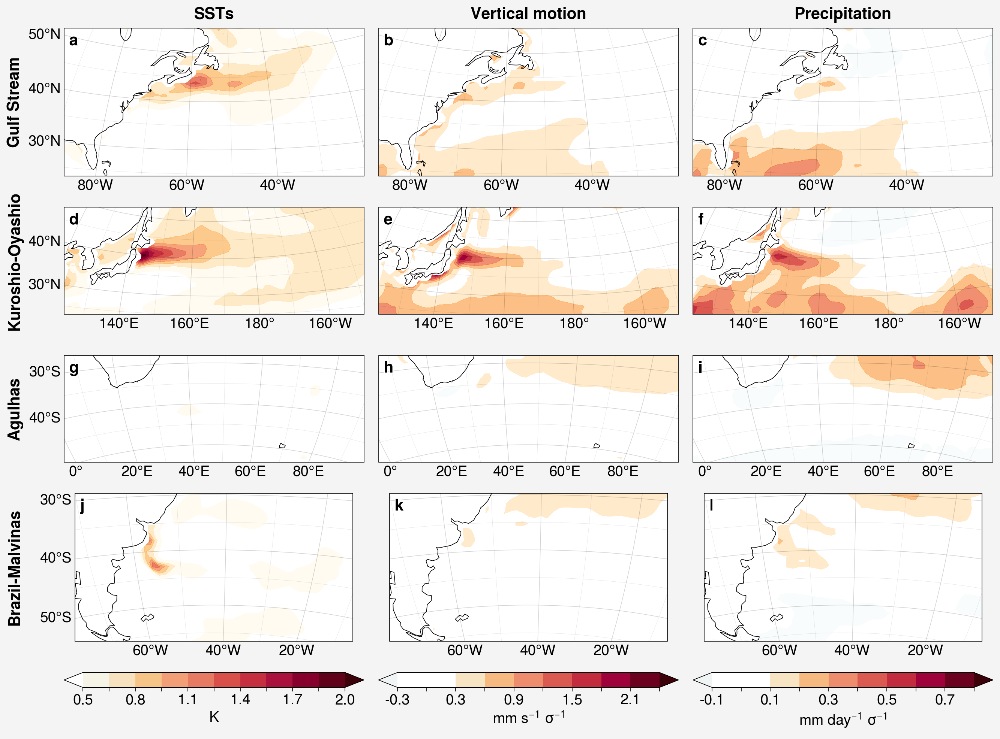

In [6]:
gs = pplt.GridSpec(ncols=3, nrows=4)
fig = pplt.figure(refwidth=4)  #suptitle='Standard deviations of monthly anomalies')
cmap1 = pplt.Colormap('Blues_r', 'fire', name='Diverging')

# Define the contour levels for the plots
lvlsSST = np.arange(0.5, 2.1, 0.15)
lvlsW = np.arange(-0.3, 2.41, 0.3)
lvlsPrect = np.arange(-0.1, 0.81, 0.1)
normW = pplt.Norm('diverging', fair=True, vmin=-0.3, vcenter=0, vmax=2.4)
normPrect = pplt.Norm('diverging', fair=True, vmin=-0.1, vcenter=0, vmax=0.8)

for ii, val in enumerate(regionLabels):

    # Determine the winter months depending on which hemisphere the region of interest is located in
    if regionHemisphere[ii] == 'North':
        datei = slice('0250-06', '0500-07')
        months = [10, 11, 12, 1, 2, 3]
    elif regionHemisphere[ii] == 'South':
        datei = slice('0250-01', '0500-12')
        months = [4, 5, 6, 7, 8, 9]


    path = '/glade/work/jamesl/iHESP/LR/monthly/'
    SSTLRanom = xr.open_dataset(path+'iHESP.LR.PIctrl.h0.SST.withNan.anomalies.020001-050201.nc', use_cftime=True
                                )['SST'].sel(time=datei,
                                             # lon=slice(region[ii]['lonw'], region[ii]['lone']),
                                             lat=slice(region[ii]['lats'], region[ii]['latn'])).load()

    wLRanom = xr.open_dataset(path+'iHESP.LR.PIctrl.h0.w.withNan.anomalies.020001-050112.nc', use_cftime=True
                              )['w'].sel(time=datei,
                                         # lon=slice(region[ii]['lonw'], region[ii]['lone']),
                                         lat=slice(region[ii]['lats'], region[ii]['latn'])
                                         ).load().interp_like(SSTLRanom[0], kwargs={"fill_value": "extrapolate"}
                                                              )*1000  # convert to mm/s

    prectLRanom = xr.open_dataset(path+'iHESP.LR.PIctrl.h0.PRECT.withNan.anomalies.1000kmHPfilter.025001-050012.nc', use_cftime=True
                                  )['PRECT'].sel(time=datei,
                                                 # lon=slice(region[ii]['lonw'], region[ii]['lone']),
                                                 lat=slice(region[ii]['lats'], region[ii]['latn'])
                                                 ).load().interp_like(SSTLRanom[0], kwargs={"fill_value": "extrapolate"})


    wReg = wLRanom[0].copy(deep=True)
    prectReg = prectLRanom[0].copy(deep=True)

    data  = wLRanom[wLRanom['time.month'].isin(months)]
    data1 = stand(SSTLRanom[SSTLRanom['time.month'].isin(months)])
    wReg[:, :] = linregress_3D(data1.values, data.values)[2]

    data  = prectLRanom[prectLRanom['time.month'].isin(months)]
    data1 = stand(SSTLRanom[SSTLRanom['time.month'].isin(months)])
    prectReg[:, :] = linregress_3D(data1.values, data.values)[2]

    data = SSTLRanom[SSTLRanom['time.month'].isin(months)].std('time')

    # Plot the data in each column
    ax = generate_subplot(fig, gs[ii, 0], region[ii])
    m = ax.contourf(data, levels=lvlsSST, extend='both', cmap=redsWhite)

    ax = generate_subplot(fig, gs[ii, 1], region[ii], latlabels=False)
    n = ax.contourf(wReg, levels=lvlsW, extend='both', cmap=divCmap, norm=normW)

    ax = generate_subplot(fig, gs[ii, 2], region[ii], latlabels=False)
    o = ax.contourf(prectReg, levels=lvlsPrect, extend='both', cmap=divCmap, norm=normPrect)

fig.format(rowlabels=regionLabels,
           collabels=['SSTs', 'Vertical motion', 'Precipitation'])

tlabels = [str(np.round(val, decimals=1)) for val in lvlsSST]
tlabels = ["" if i % 2 == 1 else elem for i, elem in enumerate(tlabels)]
fig.colorbar(m, loc='b', label='K', col=1, ticklabels=tlabels)

tlabels = [str(np.round(val, decimals=1)) for val in lvlsW]
tlabels = ["" if i % 2 == 1 else elem for i, elem in enumerate(tlabels)]
fig.colorbar(n, loc='b', label='mm s$^{-1}$ σ$^{-1}$', col=2, ticklabels=tlabels)

tlabels = [str(np.round(val, decimals=1)) for val in lvlsPrect]
tlabels = ["" if i % 2 == 1 else elem for i, elem in enumerate(tlabels)]
fig.colorbar(o, loc='b', label='mm day$^{-1}$ σ$^{-1}$', col=3, ticklabels=tlabels)

fig.save('figures/Fig5-stdDevOfAnomalousSST-regressW850_filtPRECT-iHESP-LR-LarsonThompsonHurrell2024.pdf')



# Extended Data Figures Below

## Extended Data Fig 1: As in Figure 2 but for observations

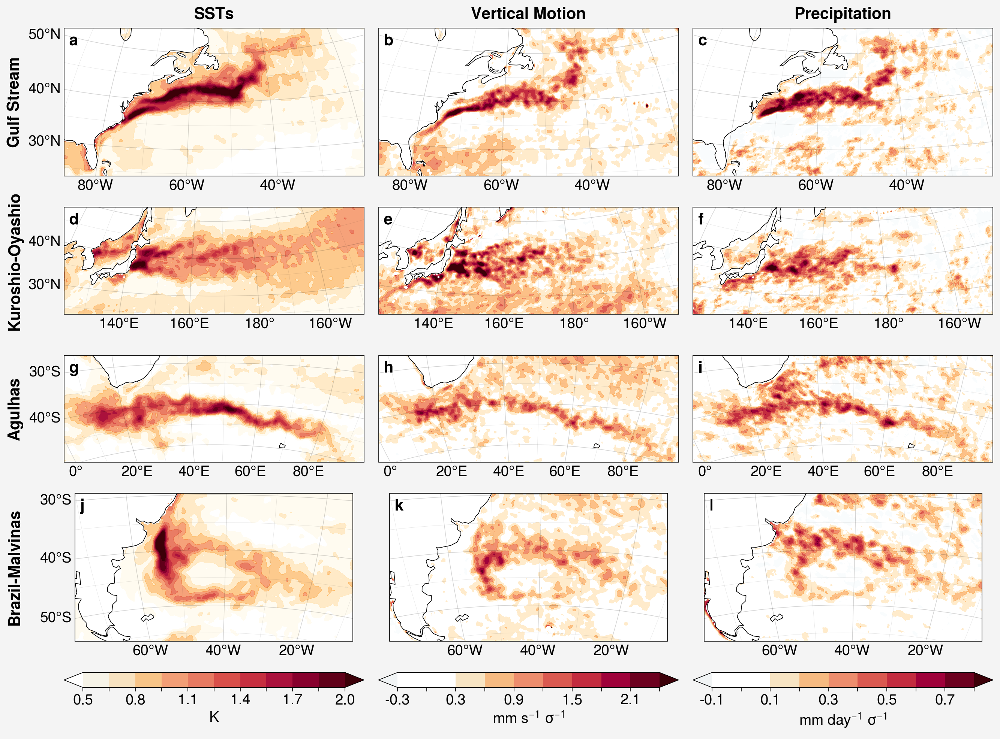

In [17]:
gs = pplt.GridSpec(ncols=3, nrows=4)
fig = pplt.figure(refwidth=4)

# Define the contour levels for the plots
lvlsSST = np.arange(0.5, 2.1, 0.15)
lvlsW = np.arange(-0.3, 2.41, 0.3)
lvlsPrect = np.arange(-0.1, 0.81, 0.1)
normW = pplt.Norm('diverging', fair=True, vmin=-0.3, vcenter=0, vmax=2.4)
normPrect = pplt.Norm('diverging', fair=True, vmin=-0.1, vcenter=0, vmax=0.8)

for ii, val in enumerate(regionLabels):

    # Load in the data of interest
    if ii < 2:
        dateG = slice('2000-10', '2023-03')
        dateE = slice('2007-10', '2023-03')
        months = [10, 11, 12, 1, 2, 3]
    elif ii >= 2:
        dateG = slice('2001-04', '2022-09')
        dateE = slice('2008-04', '2023-09')
        months = [4, 5, 6, 7, 8, 9]

    path = '/glade/work/jamesl/OISST/'
    SSTOIanom = xr.open_dataset(path+'oisst-avhrr-v02r01.h0.sst.anomalies.200001-202312.nc'
                                )['sst'].sel(time=dateG,
                                             # lon=slice(region[ii]['lonw'], region[ii]['lone']),
                                             lat=slice(region[ii]['lats'], region[ii]['latn'])).load()
    SSTOIanom = SSTOIanom.where(land_mask(SSTOIanom))  # Mask out lakes


    path = '/glade/work/jamesl/GPM/'
    prectGPManom = xr.open_dataset(path+'GPM.h0.precip.anomalies.1000kmHighPassFiltered.200006-202305.nc'
                                   )['precipitation'].sel(time=dateG,
                                                          # lon=slice(region[ii]['lonw'], region[ii]['lone']),
                                                          lat=slice(region[ii]['lats'], region[ii]['latn'])).load()

    SSTOIanom = SSTOIanom.interp_like(prectGPManom[0])
    prectGPManomReg = prectGPManom[0].copy(deep=True)

    data0 = SSTOIanom[SSTOIanom['time.month'].isin(months)].std('time')

    data  = prectGPManom[prectGPManom['time.month'].isin(months)]
    data1 = stand(SSTOIanom[SSTOIanom['time.month'].isin(months)])
    prectGPManomReg[:, :] = linregress_3D(data1.values, data.values)[2]

    path = '/glade/work/jamesl/OISST/'
    SSTOIanom = xr.open_dataset(path+'oisst-avhrr-v02r01.h0.sst.anomalies.200001-202312.nc'
                                )['sst'].sel(time=dateE,
                                             # lon=slice(region[ii]['lonw'], region[ii]['lone']),
                                             lat=slice(region[ii]['lats'], region[ii]['latn'])).load()
    SSTOIanom = SSTOIanom.where(land_mask(SSTOIanom))  # Mask out lakes

    path = '/glade/work/jamesl/ERA5/'
    wE5anom = xr.open_dataset(path+'ERA5.h0.w.anomalies.200701-202309.nc'
                              )['w'].sel(time=dateE, level=850,
                                         # lon=slice(region[ii]['lonw'], region[ii]['lone']),
                                         lat=slice(region[ii]['lats'], region[ii]['latn'])
                                         ).load()*1000

    SSTOIanom = SSTOIanom.interp_like(wE5anom[0])
    wE5anomReg = wE5anom[0].copy(deep=True)

    data  = wE5anom[wE5anom['time.month'].isin(months)]
    data1 = stand(SSTOIanom[SSTOIanom['time.month'].isin(months)])
    wE5anomReg[:, :] = linregress_3D(data1.values, data.values)[2]

    # Plot the data in each column
    ax = generate_subplot(fig, gs[ii, 0], region[ii])
    m = ax.contourf(data0, levels=lvlsSST, extend='both', cmap=redsWhite)

    ax = generate_subplot(fig, gs[ii, 1], region[ii], latlabels=False)
    n = ax.contourf(wE5anomReg, levels=lvlsW, extend='both', cmap=divCmap, norm=normW)

    ax = generate_subplot(fig, gs[ii, 2], region[ii], latlabels=False)
    o = ax.contourf(prectGPManomReg, levels=lvlsPrect, extend='both', cmap=divCmap, norm=normPrect)

fig.format(rowlabels=regionLabels, collabels=['SSTs', 'Vertical Motion', 'Precipitation'])

tlabels = [str(np.round(val, decimals=3)) for val in lvlsSST]
tlabels = ["" if i % 2 == 1 else elem for i, elem in enumerate(tlabels)]
fig.colorbar(m, loc='b', label='K', col=1, ticklabels=tlabels)

tlabels = [str(np.round(val, decimals=3)) for val in lvlsW]
tlabels = ["" if i % 2 == 1 else elem for i, elem in enumerate(tlabels)]
fig.colorbar(n, loc='b', label='mm s$^{-1}$ σ$^{-1}$', col=2, ticklabels=tlabels)

tlabels = [str(np.round(val, decimals=1)) for val in lvlsPrect]
tlabels = ["" if i % 2 == 1 else elem for i, elem in enumerate(tlabels)]
fig.colorbar(o, loc='b', label='mm day$^{-1}$ σ$^{-1}$', col=3, ticklabels=tlabels)

fig.save('figures/ED-Fig1-stdDevOfAnomalousSST_regressonOf_w850_PRECT-OISST-ERA5-GPM-LarsonThompsonHurrell2024.jpeg')



# Extended Data Fig 2: Same as Fig 2 middle and right columns but shows correlations with stippling in regions of significance (1 dof per month)

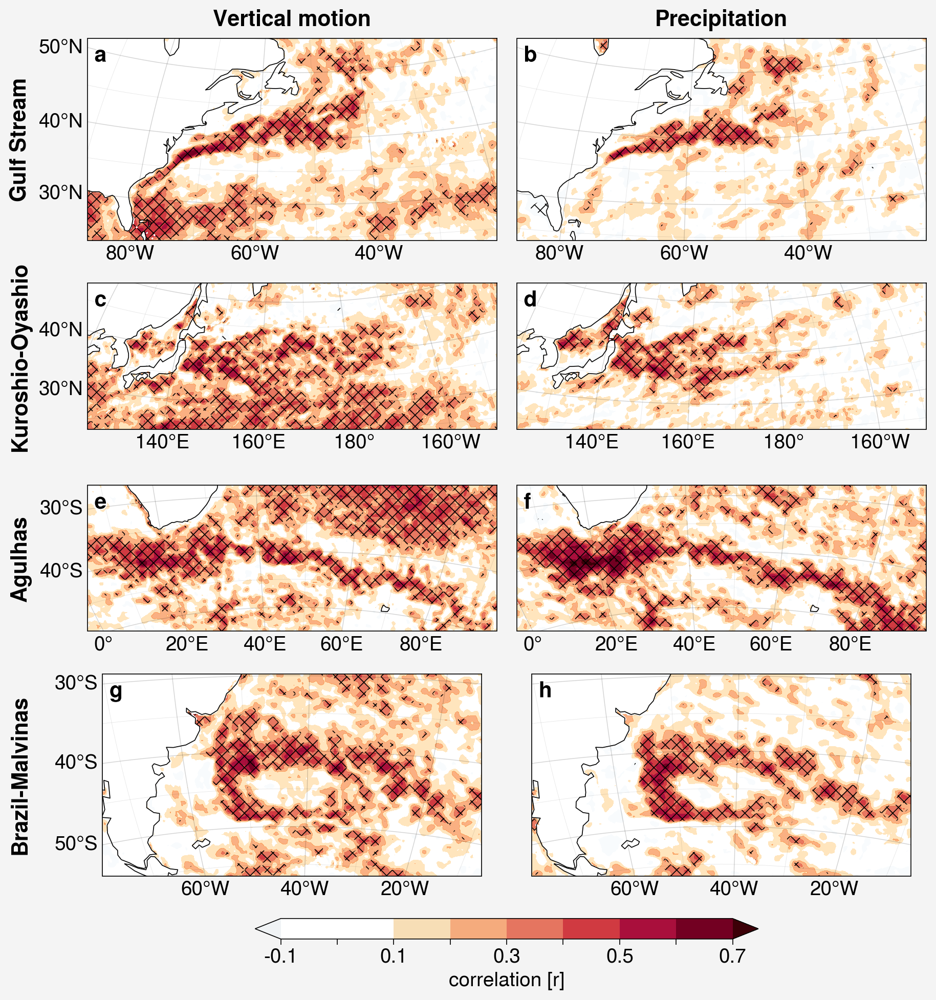

In [18]:
gs = pplt.GridSpec(ncols=2, nrows=4)
fig = pplt.figure(refwidth=4)

lvls = np.arange(-0.1, 0.71, 0.1)
norm = pplt.Norm('diverging', fair=True, vmin=-0.1, vcenter=0, vmax=0.7)

for ii, val in enumerate(regionLabels):

    # Determine the winter months depending on which hemisphere the region of interest is located in
    if regionHemisphere[ii] == 'North':
        dateE = slice('2007-10', '2023-03')
        months = [10, 11, 12, 1, 2, 3]
    elif regionHemisphere[ii] == 'South':
        dateE = slice('2008-04', '2023-09')
        months = [4, 5, 6, 7, 8, 9]

    path = '/glade/work/jamesl/ERA5/'
    SSTE5anom = xr.open_dataset(path+'ERA5.h0.SST.detrended.anomalies.197901-202309.nc'
                                )['SST'].sel(time=dateE,
                                             # lon=slice(region[ii]['lonw'], region[ii]['lone']),
                                             lat=slice(region[ii]['lats'], region[ii]['latn'])
                                             ).load()
    SSTE5anom = SSTE5anom.where(land_mask(SSTE5anom))

    wE5anom = xr.open_dataset(path+'ERA5.h0.w.anomalies.200701-202309.nc'
                              )['w'].sel(time=dateE, level=850,
                                         # lon=slice(region[ii]['lonw'], region[ii]['lone']),
                                         lat=slice(region[ii]['lats'], region[ii]['latn'])
                                         ).load()*1000

    prectE5anom = xr.open_dataset(path+'ERA5.h0.PRECT.anomalies.41HPfilter.197901-202309.nc'
                                  )['PRECT'].sel(time=dateE,
                                                 # lon=slice(region[ii]['lonw'], region[ii]['lone']),
                                                 lat=slice(region[ii]['lats'], region[ii]['latn'])).load()

    wE5anomCorr = wE5anom[0].copy(deep=True)
    prectE5anomCorr = prectE5anom[0].copy(deep=True)

    data  = wE5anom[wE5anom['time.month'].isin(months)]
    data1 = stand(SSTE5anom[SSTE5anom['time.month'].isin(months)])
    wE5anomCorr[:, :] = linregress_3D(data1.values, data.values)[1]

    dof = data.shape[0]  # set dof to 1 per month
    wE5anomTvals = wE5anomCorr*np.sqrt(dof-2)/np.sqrt(1-wE5anomCorr**2)
    tStatUpW = stats.t.ppf(.995, loc=0, scale=1.0, df=dof)

    data  = prectE5anom[prectE5anom['time.month'].isin(months)]
    data1 = stand(SSTE5anom[SSTE5anom['time.month'].isin(months)])
    prectE5anomCorr[:, :] = linregress_3D(data1.values, data.values)[1]

    # Calculate the t statistic
    dof = data.shape[0]  # set dof to 1 per month
    prectE5anomTvals = prectE5anomCorr*np.sqrt(dof-2)/np.sqrt(1-prectE5anomCorr**2)
    tStatUpPrect = stats.t.ppf(.995, loc=0, scale=1.0, df=dof)

    # m, ax = plot_it(gs[ii, 0], wE5anomCorr, lvls, region[ii], cmap=cmap1)
    # ax.contourf(np.abs(wE5anomTvals), levels=np.array([-10, tStatUpW, 20]),
    #             hatches=['', 'xxx'], color=('none', 'none'))

    # n, ax = plot_it(gs[ii, 1], prectE5anomCorr, lvls, region[ii], cmap=cmap1, latlabels=False)
    # ax.contourf(np.abs(prectE5anomTvals), levels=np.array([-10, tStatUpPrect, 20]),
    #             hatches=['', 'xxx'], color=('none', 'none'))

    # Plot the data in each column
    ax = generate_subplot(fig, gs[ii, 0], region[ii])
    m = ax.contourf(wE5anomCorr, levels=lvls, extend='both', cmap=divCmap, norm=norm)
    ax.contourf(np.abs(wE5anomTvals), levels=np.array([-10, tStatUpW, 20]),
                hatches=['', 'xxx'], color=('none', 'none'))

    ax = generate_subplot(fig, gs[ii, 1], region[ii], latlabels=False)
    n = ax.contourf(prectE5anomCorr, levels=lvls, extend='both', cmap=divCmap, norm=norm)
    ax.contourf(np.abs(prectE5anomTvals), levels=np.array([-10, tStatUpPrect, 20]),
                hatches=['', 'xxx'], color=('none', 'none'))

fig.format(rowlabels=regionLabels, collabels=['Vertical motion', 'Precipitation'])

tlabels = [str(np.round(val, decimals=3)) for val in lvls]
tlabels = ["" if i % 2 == 1 else elem for i, elem in enumerate(tlabels)]
fig.colorbar(m, loc='b', label='correlation [r]', length=0.6, ticklabels=tlabels)

fig.save('figures/ED-Fig2-corrOfw850_PRECT-stippling99PercentTwoTail96dof-ERA5-LarsonThompsonHurrell2024.jpeg')



# Extended Data Fig 3: The correlations squared between vertical motion and precipitation and the SST field (i.e., as in SI Fig. 2, but for r^2 and without the stippling).

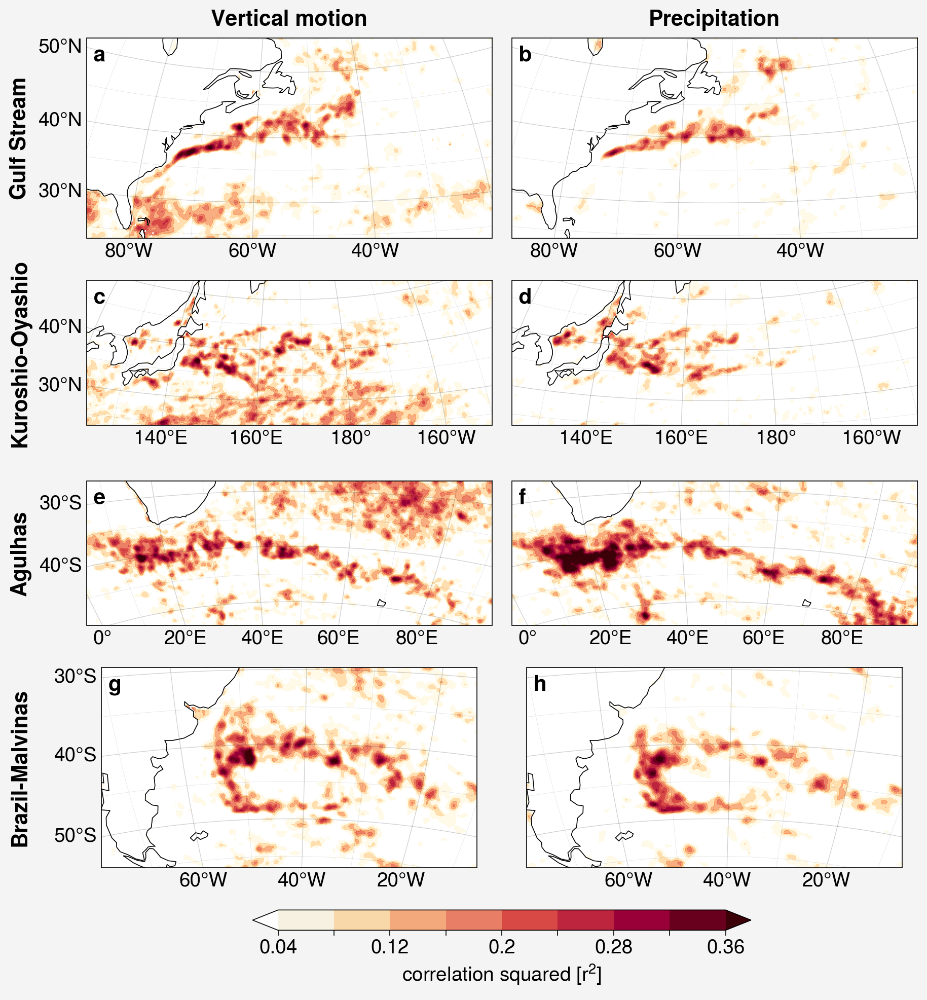

In [19]:
gs = pplt.GridSpec(ncols=2, nrows=4)
fig = pplt.figure(refwidth=4)

lvls = np.arange(0.04, 0.361, 0.04)

for ii, val in enumerate(regionLabels):

    # Determine the winter months depending on which hemisphere the region of interest is located in
    if regionHemisphere[ii] == 'North':
        dateE = slice('2007-10', '2023-03')
        months = [10, 11, 12, 1, 2, 3]
    elif regionHemisphere[ii] == 'South':
        dateE = slice('2008-04', '2023-09')
        months = [4, 5, 6, 7, 8, 9]

    path = '/glade/work/jamesl/ERA5/'
    SSTE5anom = xr.open_dataset(path+'ERA5.h0.SST.detrended.anomalies.197901-202309.nc'
                                )['SST'].sel(time=dateE,
                                             # lon=slice(region[ii]['lonw'], region[ii]['lone']),
                                             lat=slice(region[ii]['lats'], region[ii]['latn'])
                                             ).load()
    SSTE5anom = SSTE5anom.where(land_mask(SSTE5anom))

    wE5anom = xr.open_dataset(path+'ERA5.h0.w.detrended.anomalies.197901-202309.nc'
                              )['w'].sel(time=dateE, level=850,
                                         # lon=slice(region[ii]['lonw'], region[ii]['lone']),
                                         lat=slice(region[ii]['lats'], region[ii]['latn'])
                                         ).load()*1000  # convert from m/s to mm/s

    prectE5anom = xr.open_dataset(path+'ERA5.h0.PRECT.detrended.anomalies.1000kmHighPassFiltered.200701-202309.nc'
                                  )['PRECT'].sel(time=dateE,
                                                 # lon=slice(region[ii]['lonw'], region[ii]['lone']),
                                                 lat=slice(region[ii]['lats'], region[ii]['latn'])).load()


    wE5anomCorr = wE5anom[0].copy(deep=True)
    prectE5anomCorr = prectE5anom[0].copy(deep=True)

    data  = wE5anom[wE5anom['time.month'].isin(months)]
    data1 = stand(SSTE5anom[SSTE5anom['time.month'].isin(months)])
    wE5anomCorr[:, :] = linregress_3D(data1.values, data.values)[1]**2

    dof = data.shape[0]  # set dof to 1 per month
    wE5anomTvals = wE5anomCorr*np.sqrt(dof-2)/np.sqrt(1-wE5anomCorr**2)
    tStatUpW = stats.t.ppf(.995, loc=0, scale=1.0, df=dof)

    data  = prectE5anom[prectE5anom['time.month'].isin(months)]
    data1 = stand(SSTE5anom[SSTE5anom['time.month'].isin(months)])
    prectE5anomCorr[:, :] = linregress_3D(data1.values, data.values)[1]**2

    # m, ax = plot_it(gs[ii, 0], wE5anomCorr,     lvls, region[ii], cmap=cmap1)
    # n, ax = plot_it(gs[ii, 1], prectE5anomCorr, lvls, region[ii], cmap=cmap1, latlabels=False)

    # Plot the data in each column
    ax = generate_subplot(fig, gs[ii, 0], region[ii])
    m = ax.contourf(wE5anomCorr, levels=lvls, extend='both', cmap=redsWhite)

    ax = generate_subplot(fig, gs[ii, 1], region[ii], latlabels=False)
    n = ax.contourf(prectE5anomCorr, levels=lvls, extend='both', cmap=redsWhite)


fig.format(rowlabels=regionLabels, collabels=['Vertical motion', 'Precipitation'])

tlabels = [str(np.round(val, decimals=3)) for val in lvls]
tlabels = ["" if i % 2 == 1 else elem for i, elem in enumerate(tlabels)]
fig.colorbar(m, loc='b', label='correlation squared [r$^{2}$]', length=0.6, ticklabels=tlabels)

fig.save('figures/ED-Fig3-corrSquaredOfw850_PRECT-ERA5-LarsonThompsonHurrell2024.jpeg')



# Extended Data Fig 4: Masks used in the vertical profile

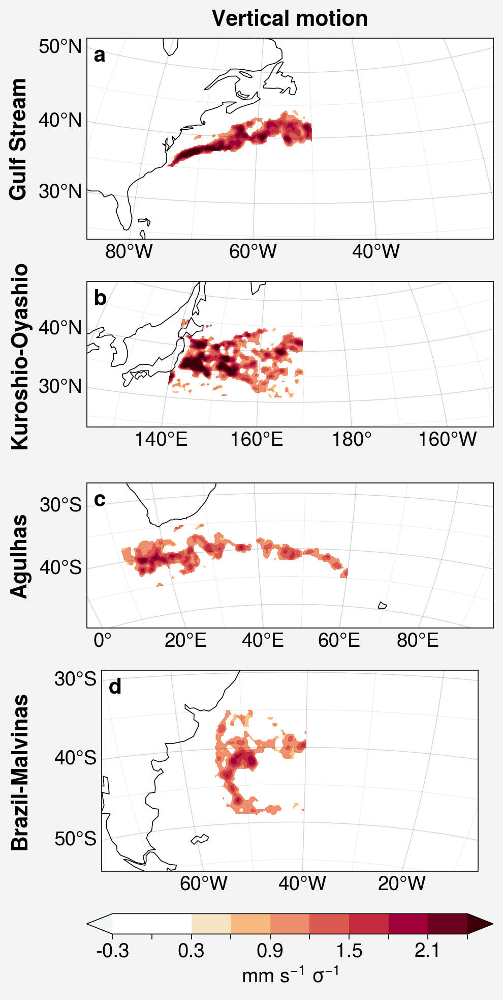

In [20]:
gs = pplt.GridSpec(ncols=1, nrows=4)
fig = pplt.figure(refwidth=4)

lvlsW = np.arange(-0.3, 2.41, 0.3)
normW = pplt.Norm('diverging', fair=True, vmin=-0.3, vcenter=0, vmax=2.4)

for ii, val in enumerate(regionLabels):

    # Determine the winter months depending on which hemisphere the region of interest is located in
    if regionHemisphere[ii] == 'North':
        dateE = slice('2007-10', '2023-03')
        months = [10, 11, 12, 1, 2, 3]
    elif regionHemisphere[ii] == 'South':
        dateE = slice('2008-04', '2023-09')
        months = [4, 5, 6, 7, 8, 9]

    path = '/glade/work/jamesl/ERA5/'
    SSTE5anom = xr.open_dataset(path+'ERA5.h0.SST.detrended.anomalies.197901-202309.nc'
                                )['SST'].sel(time=dateE,
                                             lon=slice(regionInd[ii]['lonw'], regionInd[ii]['lone']),
                                             lat=slice(regionInd[ii]['lats'], regionInd[ii]['latn'])
                                             ).load()
    SSTE5anom = SSTE5anom.where(land_mask(SSTE5anom))

    wE5anom = xr.open_dataset(path+'ERA5.h0.w.anomalies.200701-202309.nc'
                              )['w'].sel(time=dateE, level=850,
                                         lon=slice(regionInd[ii]['lonw'], regionInd[ii]['lone']),
                                         lat=slice(regionInd[ii]['lats'], regionInd[ii]['latn'])
                                         ).load()*1000

    wE5anomReg = wE5anom[0].copy(deep=True)

    data  = wE5anom[wE5anom['time.month'].isin(months)]
    data1 = stand(SSTE5anom[SSTE5anom['time.month'].isin(months)])
    wE5anomReg[:, :] = linregress_3D(data1.values, data.values)[2]

    # m, ax = plot_it(gs[ii, 0], wE5anomReg.where(wE5anomReg > 0.8), lvlsW, region[ii], cmap=cmap1)

    ax = generate_subplot(fig, gs[ii, 0], region[ii])
    m = ax.contourf(wE5anomReg.where(wE5anomReg > 0.8), levels=lvlsW, extend='both',
                    cmap=divCmap, norm=normW)

fig.format(rowlabels=regionLabels, collabels=['Vertical motion'])

tlabels = [str(np.round(val, decimals=3)) for val in lvlsW]
tlabels = ["" if i % 2 == 1 else elem for i, elem in enumerate(tlabels)]
fig.colorbar(m, loc='b', label='mm s$^{-1}$ σ$^{-1}$', length=1, ticklabels=tlabels)

fig.save('figures/ED-Fig4-spatialMasksOfRegressonOfw850-ERA5-LarsonThompsonHurrell2024.jpeg')



## Extended Data Fig 5: The effect of high-pass spatial filtering the precipitation field: (left) filtered total precip, (center) convective precip, (right) unfiltered total precip

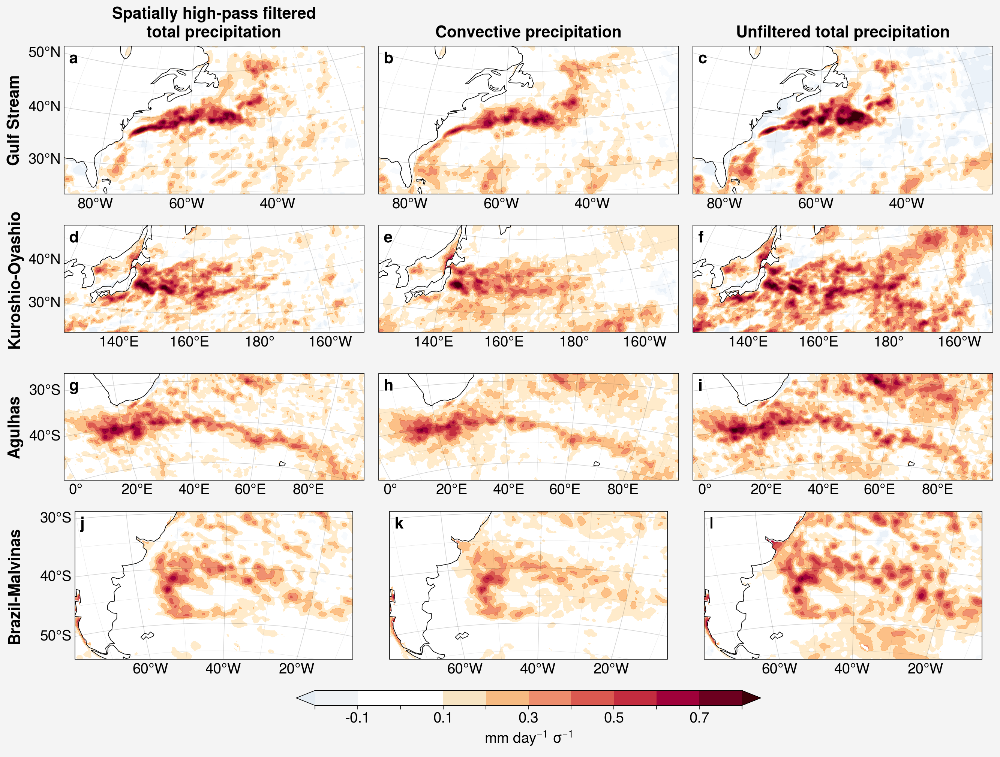

In [33]:
gs = pplt.GridSpec(ncols=3, nrows=4)
fig = pplt.figure(refwidth=4)

lvlsPrect = np.arange(-0.2, 0.81, 0.1)
normPrect = pplt.Norm('diverging', fair=True, vmin=-0.2, vcenter=0, vmax=0.8)

for ii, val in enumerate(regionLabels):

    # Load in the data of interest
    if ii < 2:
        dateE = slice('2007-10', '2023-03')
        months = [10, 11, 12, 1, 2, 3]
    elif ii >= 2:
        dateE = slice('2008-04', '2023-09')
        months = [4, 5, 6, 7, 8, 9]

    path = '/glade/work/jamesl/ERA5/'
    SSTE5anom = xr.open_dataset(path+'ERA5.h0.SST.detrended.anomalies.197901-202309.nc'
                                )['SST'].sel(time=dateE,
                                             # lon=slice(region[ii]['lonw'], region[ii]['lone']),
                                             lat=slice(region[ii]['lats'], region[ii]['latn'])
                                             ).load()
    SSTE5anom = SSTE5anom.where(land_mask(SSTE5anom))

    prectE5anom = xr.open_dataset(path+'ERA5.h0.PRECT.detrended.anomalies.197901-202309.nc'
                                  )['PRECT'].sel(time=dateE,
                                                 # lon=slice(region[ii]['lonw'], region[ii]['lone']),
                                                 lat=slice(region[ii]['lats'], region[ii]['latn'])
                                                 ).load()

    prectFiltE5anom = xr.open_dataset(path+'ERA5.h0.PRECT.detrended.anomalies.1000kmHighPassFiltered.200701-202309.nc'
                                      )['PRECT'].sel(time=dateE,
                                                     # lon=slice(region[ii]['lonw'], region[ii]['lone']),
                                                     lat=slice(region[ii]['lats'], region[ii]['latn'])).load()

    cpE5anom = xr.open_dataset(path+'ERA5.h0.cp.detrended.anomalies.197901-202309.nc'
                               )['cp'].sel(time=dateE,
                                           # lon=slice(region[ii]['lonw'], region[ii]['lone']),
                                           lat=slice(region[ii]['lats'], region[ii]['latn'])).load()

    cpE5anomReg = cpE5anom[0].copy(deep=True)
    prectE5anomReg = prectE5anom[0].copy(deep=True)
    prectFiltE5anomReg = prectFiltE5anom[0].copy(deep=True)

    data  = prectFiltE5anom[prectFiltE5anom['time.month'].isin(months)]
    data1 = stand(SSTE5anom[SSTE5anom['time.month'].isin(months)])
    prectFiltE5anomReg[:, :] = linregress_3D(data1.values, data.values)[2]

    data  = prectE5anom[prectE5anom['time.month'].isin(months)]
    data1 = stand(SSTE5anom[SSTE5anom['time.month'].isin(months)])
    prectE5anomReg[:, :] = linregress_3D(data1.values, data.values)[2]

    data  = cpE5anom[cpE5anom['time.month'].isin(months)]
    data1 = stand(SSTE5anom[SSTE5anom['time.month'].isin(months)])
    cpE5anomReg[:, :] = linregress_3D(data1.values, data.values)[2]

    # Plot the data in each column
    ax = generate_subplot(fig, gs[ii, 0], region[ii])
    m = ax.contourf(prectFiltE5anomReg, levels=lvlsPrect, extend='both', cmap=divCmap, norm=normPrect)

    ax = generate_subplot(fig, gs[ii, 1], region[ii], latlabels=False)
    n = ax.contourf(cpE5anomReg, levels=lvlsPrect, extend='both', cmap=divCmap, norm=normPrect)

    ax = generate_subplot(fig, gs[ii, 2], region[ii], latlabels=False)
    o = ax.contourf(prectE5anomReg, levels=lvlsPrect, extend='both', cmap=divCmap, norm=normPrect)

fig.format(rowlabels=regionLabels,
           collabels=['Spatially high-pass filtered\ntotal precipitation', 'Convective precipitation',
                      'Unfiltered total precipitation'])

tlabels = [str(np.round(val, decimals=1)) for val in lvlsPrect]
tlabels = ["" if i % 2 == 0 else elem for i, elem in enumerate(tlabels)]
fig.colorbar(n, loc='b', label='mm day$^{-1}$ σ$^{-1}$', length=0.5, ticklabels=tlabels)

# tlabels = [str(np.round(val, decimals=2)) for val in lvlsPrectFilt]
# tlabels = ["" if i % 2 == 1 else elem for i, elem in enumerate(tlabels)]
# fig.colorbar(o, loc='b', label='mm day$^{-1}$', col=2, ticklabels=tlabels)

# fig.save('regressionOfPRECT-unfiltVsFilt-ERA5-LarsonThompsonHurrell2024.png')
fig.save('figures/ED-Fig5-regressionOf_filtPRECT_ConvPrecip_unfiltPRET-ERA5-LarsonThompsonHurrell2024.jpeg')


# Extended Data Figure 6: The distribution of daily-mean precipitation for a sample point.

## Create the inset for Extended Data Figure 6

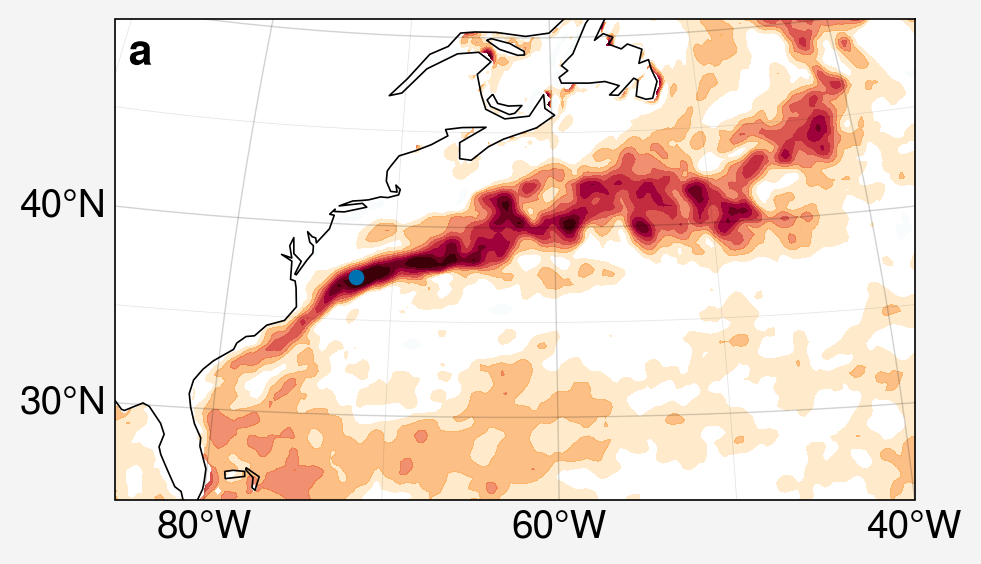

In [32]:
# Set up the grid for the plots and create the figure with a reference width for the subplots
gs = pplt.GridSpec(ncols=1, nrows=1)
fig = pplt.figure(refwidth=4)

# Define the contour levels for the plots
lvlsW = np.arange(-0.3, 2.41, 0.3)
normW = pplt.Norm('diverging', fair=True, vmin=-0.3, vcenter=0, vmax=2.4)

ii = 0
dateE = slice('2007-10', '2023-03')
months = [10, 11, 12, 1, 2, 3]

# Select the regions of interest (roi)
SST_roi = SSTdetAnom.sel(time=dateE,
                         lon=slice(region[ii]['lonw'], region[ii]['lone']),
                         lat=slice(region[ii]['lats'], region[ii]['latn'])
                         )
# Mask out the lakes in land regions
SST_roi = SST_roi.where(land_mask(SST_roi))

w_roi = wdetAnom.sel(time=dateE, level=850,
                     lon=slice(region[ii]['lonw'], region[ii]['lone']),
                     lat=slice(region[ii]['lats'], region[ii]['latn'])
                     )

# Preallocate regression arrays
wReg = w_roi[0].copy(deep=True)

# Index the winter months and standardize SST anomalies
data  = w_roi[w_roi['time.month'].isin(months)]
data1 = stand(SST_roi[SST_roi['time.month'].isin(months)])
# Regress anomalous vertical motion onto standardized SST anomlies
wReg[:, :] = linregress_3D(data1.values, data.values)[2]

# Plot the data in each column
# 'lats': 19,  'latn': 58,  'lonw': 268,   'lone': 344
ax = fig.subplot(gs[0], proj='aeqd', coast=True, labels=True, lonlabels='b', latlabels='l',
                 land=True, landcolor='white', abc=True, abcloc='upper left',
                 latlines=10, lonlines=20, gridminor=True, latminorlines=5, lonminorlines=10,
                 lonlim=(275, 320), latlim=(25, 50),
                 proj_kw={'central_longitude': (275 + 320) / 2},
                 )

m = ax.contourf(wReg, levels=lvlsW, extend='both', cmap=divCmap, norm=normW)
n = ax.scatter(x=287.75, y=37.25, markersize=25)

# fig.format(rowlabels=regionLabels,
#            collabels=['SSTs', 'Vertical motion', 'Precipitation'])

# Add colorbars and ensure that the tick labels are neat and at a consistent spacing
# tlabels = [str(np.round(val, decimals=1)) for val in lvlsW]
# tlabels = ["" if i % 2 == 1 else elem for i, elem in enumerate(tlabels)]
# fig.colorbar(m, loc='b', label='mm s$^{-1}$ σ$^{-1}$', ticklabels=tlabels)

fig.save('figures/inset-regressonOfw850ontoSSTanomalies-detrended-ERA5-LarsonThompsonHurrell2024.jpeg')
